In [ ]:
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# Set the style for seaborn
sns.set(style="darkgrid")

pastel_red = 'rgba(255, 99, 132, 0.6)'
pastel_green = 'rgba(144, 238, 144, 0.6)'
Pastel_yellow ='rgba(255, 223, 102, 0.6)'
Pastel_blue = 'rgba(173, 216, 230, 0.6)'	
Pastel_purple = 'rgba(218, 112, 214, 0.6)'	
Pastel_orange = 'rgba(255, 179, 102, 0.6)'	
Pastel_gray = 'rgba(200, 200, 200, 0.6)'

sns.set_style('darkgrid')
plt.style.use('dark_background')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10,6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'


In [1]:
raw_df = pd.read_csv('https://raw.githubusercontent.com/S-Sanjai/ML-fundamentals/refs/heads/main/Projects/02-logistic-regression-for-classification/data/weatherAUS.csv')

In [2]:
raw_df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
145458,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [3]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

### Why Drop Rows with Null Values in the `RainTomorrow` Column?

In supervised machine learning, models learn to make predictions based on labeled data—where the target variable (label) is known. In our dataset, the `RainTomorrow` column serves as the label indicating whether it will rain the next day.

Rows with missing values in the `RainTomorrow` column lack this crucial label, making them unsuitable for training or evaluating our model. Including such rows would prevent the model from learning the relationship between features and the target, and would also hinder the assessment of prediction accuracy.

**Therefore, we drop all rows where `RainTomorrow` is null to ensure our dataset contains only labeled examples, enabling effective model training and evaluation.**

In [4]:
raw_df.dropna(subset=['RainToday', 'RainTomorrow'], inplace=True)
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 140787 entries, 0 to 145458
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           140787 non-null  object 
 1   Location       140787 non-null  object 
 2   MinTemp        140319 non-null  float64
 3   MaxTemp        140480 non-null  float64
 4   Rainfall       140787 non-null  float64
 5   Evaporation    81093 non-null   float64
 6   Sunshine       73982 non-null   float64
 7   WindGustDir    131624 non-null  object 
 8   WindGustSpeed  131682 non-null  float64
 9   WindDir9am     131127 non-null  object 
 10  WindDir3pm     137117 non-null  object 
 11  WindSpeed9am   139732 non-null  float64
 12  WindSpeed3pm   138256 non-null  float64
 13  Humidity9am    139270 non-null  float64
 14  Humidity3pm    137286 non-null  float64
 15  Pressure9am    127044 non-null  float64
 16  Pressure3pm    127018 non-null  float64
 17  Cloud9am       88162 non-null   fl

In [5]:
raw_df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145454,2017-06-20,Uluru,3.5,21.8,0.0,NaN,NaN,E,31.0,ESE,...,59.0,27.0,1024.7,1021.2,NaN,NaN,9.4,20.9,No,No
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No


In [6]:
raw_df.Location.nunique()

49

In [7]:
fig = px.histogram(raw_df, x='Location', color='RainToday',
                   title='Rain Today by Location',
                   template='plotly_dark')
fig.show()

### Analysis of "Rain Today by Location" Histogram

The above histogram visualizes the distribution of rainy and non-rainy days across different locations in the dataset. Each bar represents the count of days for a specific location, with colors distinguishing whether it rained on that day (`RainToday = Yes`) or not (`RainToday = No`).

**Key Insights:**
- Locations with taller bars experienced more recorded days in the dataset.
- The color split within each bar shows the proportion of rainy versus non-rainy days for each location.
- This visualization helps identify locations with higher or lower frequencies of rain, which can be useful for further analysis or model building.

**Note:** The data may be imbalanced across locations, so some locations may dominate the chart due to having more records.

In [8]:
px.histogram(raw_df, x='RainTomorrow', color='RainToday', title='RainTomorrow vs RainToday',
             color_discrete_sequence=[pastel_red, pastel_green],
                template='plotly_dark').show()

### Interpretation of "Temperature at 3 PM vs RainTomorrow" Histogram


In [9]:
px.histogram(raw_df, x='Temp3pm', color='RainTomorrow',
             title='Temperature at 3 PM vs RainTomorrow',
                color_discrete_sequence=[pastel_red, pastel_green],
                template='plotly_dark').show()

The above histogram displays the distribution of 3 PM temperatures (`Temp3pm`) for days when it rained the next day (`RainTomorrow = Yes`) versus days when it did not (`RainTomorrow = No`). 

**Key Observations:**
- The temperature ranges on the x-axis typically span from around 0°C up to about 40°C, with most values concentrated between 10°C and 30°C.
- Bars are colored by whether it rained the following day, allowing us to compare the frequency of rain/no rain across different temperature intervals.
- We can observe if certain temperature ranges at 3 PM are more likely to be associated with rain the next day. For example, lower or moderate afternoon temperatures may show a higher proportion of "RainTomorrow = Yes" compared to higher temperatures.
- This visualization helps identify any relationship between afternoon temperature and the likelihood of rain tomorrow.

In [10]:
px.scatter(raw_df, x='MinTemp', y='MaxTemp', color='RainToday',
           title='MinTemp vs MaxTemp by RainToday',  
           color_discrete_sequence=[pastel_red, pastel_green],
           template='plotly_dark').show()

### Analysis of MinTemp vs MaxTemp Scatter Plot

The scatter plot reveals the relationship between minimum and maximum temperatures, with points colored by whether it rained that day:

**Key Observations:**
- Strong positive correlation between minimum and maximum temperatures
- Maximum temperatures typically range from 5°C to 45°C
- Minimum temperatures generally fall between -5°C and 25°C
- Rainy days (green points) tend to cluster in the moderate temperature ranges
- Non-rainy days (red points) are more prevalent at temperature extremes
- The linear relationship suggests that higher minimum temperatures generally correspond to higher maximum temperatures
- Temperature spread is wider in warmer conditions compared to colder conditions

This visualization suggests that extreme temperatures (both hot and cold) are less likely to be associated with rainfall, while moderate temperature ranges show a higher frequency of rainy days.

In [11]:
px.scatter(raw_df, x='MinTemp', y='MaxTemp', color='RainTomorrow',
           title='MinTemp vs MaxTemp by RainToday',  
           color_discrete_sequence=[pastel_red, pastel_green],
           template='plotly_dark').show()

### Analysis of Temperature Difference and Rainfall Probability

Looking at the scatter plots comparing MinTemp and MaxTemp (colored by both RainToday and RainTomorrow), an interesting pattern emerges regarding the daily temperature variation:

**Key Finding:**
- There appears to be a critical threshold in the temperature difference between maximum and minimum temperatures
- When the difference between MaxTemp and MinTemp is greater than or equal to approximately 20°C, the likelihood of rain becomes notably rare
- This is visible in both plots where the red points (no rain) dominate the regions where the vertical distance between points and the diagonal is large

**Possible Explanation:**
- Large temperature variations within a day (≥20°C) often indicate clear, dry weather conditions
- Such significant temperature swings are typically associated with low humidity and minimal cloud cover
- These conditions are less conducive to precipitation, explaining the rarity of rainfall on days with large temperature differences

**Implications for Prediction:**
- This temperature difference could serve as a valuable feature for rainfall prediction
- Days with large temperature variations might be strong indicators of continued dry weather
- This insight could be particularly useful for improving the accuracy of our rainfall prediction model

In [12]:
px.scatter(raw_df.sample(n=17000, random_state=42), x='Temp3pm', y='Humidity3pm', color='RainTomorrow',
           title='Temp3pm vs Humidity3pm by RainTomorrow (2000 Random Samples)',
           color_discrete_sequence=[pastel_red, pastel_green],
           template='plotly_dark',
           width=1000, height=500).show()


### Working with a Sample

When working with massive datasets containing millions of rows, it's a good idea to work with a sample initially, to quickly set up your model training notebook. If you'd like to work with a sample, just set the value of `use_sample` to `True`.

**Benefits:**
- Faster iteration during development
- Quicker model prototyping
- Reduced memory usage
- Easier debugging of data preprocessing steps
- More efficient workflow for initial feature engineering

Once the pipeline is established and working correctly with the sample, you can switch to the full dataset for final training and evaluation.

In [13]:
from sklearn.model_selection import train_test_split

### Dataset Splitting: Training, Validation, and Test Sets

The dataset will be split into three distinct subsets:

**Training Set (60%):**
- Used to train the model
- The model learns patterns and relationships from this data
- Largest portion of the dataset to ensure robust learning

**Validation Set (20%):**
- Used for model tuning and hyperparameter optimization
- Helps prevent overfitting by evaluating model performance on unseen data
- Guides model selection and refinement

**Test Set (20%):**
- Completely held-out data for final model evaluation
- Provides unbiased estimate of model performance
- Never used during training or tuning phases

This 60/20/20 split provides sufficient data for training while maintaining adequate sizes for validation and testing to ensure reliable model assessment.

In [14]:
train_val_df, test_df = train_test_split(raw_df, test_size=0.2, random_state=42)
train_df, val_df = train_test_split(train_val_df, test_size=0.25, random_state=42)

print(f"Train shape: {train_df.shape}")
print(f"Validation shape: {val_df.shape}")
print(f"Test shape: {test_df.shape}")

Train shape: (84471, 23)
Validation shape: (28158, 23)
Test shape: (28158, 23)


### Why Split Data by Years Rather Than Random Sampling?

Time-based splitting is more appropriate for this weather prediction task than random splitting because:

**1. Preserves Temporal Patterns**
- Weather follows seasonal and yearly patterns
- Random splitting can break these natural temporal dependencies
- Model needs to learn from continuous time periods to understand these patterns

**2. Realistic Model Evaluation**
- Real-world predictions will always be for future dates
- Random splitting allows model to "peek" at future patterns
- Year-based splitting better simulates how model will perform in production

**3. Prevents Data Leakage**
- Weather patterns are highly correlated across nearby dates
- Random splitting can leak information between train and test sets
- Time-based splits maintain proper separation of training and evaluation data

**4. Business Context**
- Weather forecasting inherently involves predicting future events
- Model should demonstrate ability to generalize to unseen future periods
- Time-based validation better aligns with actual use case


C:\Users\Sanjai\AppData\Local\Temp\ipykernel_9840\1469695734.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




<Axes: title={'center': 'No. of Rows per Year'}, xlabel='Date', ylabel='count'>

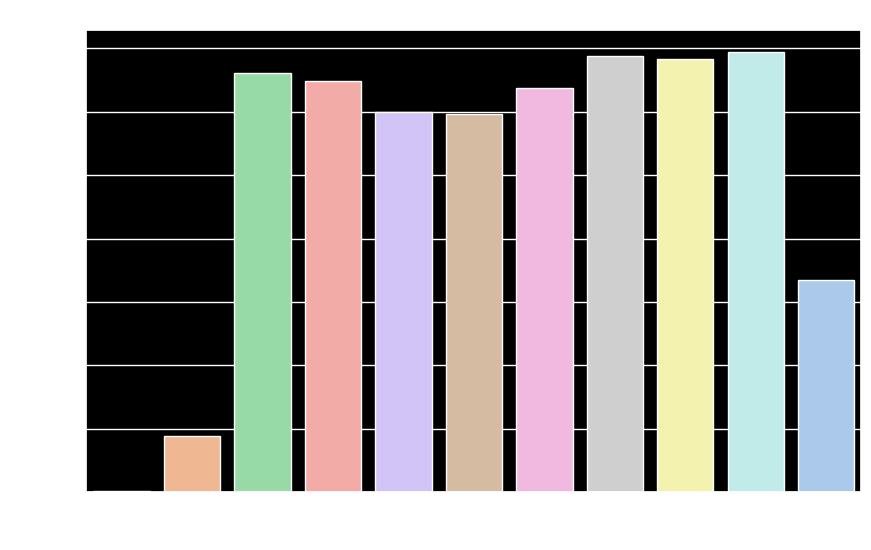

In [15]:
plt.title('No. of Rows per Year')
sns.countplot(x=pd.to_datetime(raw_df.Date).dt.year, palette='pastel')

### Data Split Analysis for Weather Prediction Model

Looking at the graph showing data distribution across years from 2007 to 2017, we can identify an optimal temporal split for our dataset:

**Training Set (2007-2014)**
* Long historical window capturing multiple seasonal cycles
* Provides robust foundation for learning weather patterns
* ~8 years of diverse meteorological conditions

**Validation Set (2015)** 
* Single full year for model tuning
* Recent enough to capture evolved patterns
* Buffer between training and test periods

**Test Set (2016-2017)**
* Most recent 2 years for final evaluation
* Validates model's ability to predict future weather
* True test of real-world performance

**This time-based splitting strategy:**
* Preserves temporal dependencies in weather patterns
* Prevents data leakage between periods
* Simulates real-world forecasting scenario
* Enables proper evaluation of model generalization

In [16]:
year = pd.to_datetime(raw_df.Date).dt.year
train_df = raw_df[year < 2015]
val_df = raw_df[year == 2015]
test_df = raw_df[year > 2015]

print(f"Train shape: {train_df.shape}")
print(f"Validation shape: {val_df.shape}")
print(f"Test shape: {test_df.shape}")

Train shape: (97988, 23)
Validation shape: (17089, 23)
Test shape: (25710, 23)


In [17]:
input_cols =  list(train_df.columns[1:-1])
target_cols = ['RainTomorrow']

We can now create inputs and targets for the training, validation and test sets for further processing and model training.

In [18]:
train_inputs = train_df[input_cols].copy()
train_targets = train_df[target_cols].copy()

val_inputs = val_df[input_cols].copy()
val_targets = val_df[target_cols].copy()

test_inputs = test_df[input_cols].copy()
test_targets = test_df[target_cols].copy()

##### Now lets also identify the columns which are of numerical type and which are of categorical type. This will come in handy late, as we will have to convert the categorical data to numerical data for training our model.

##### So to find the numeric and categorical columns we will use: 
`<'dataframe'>.select_dtypes(<'np.number/object'>).columns.tolist()`

In [19]:
numeric_cols = train_inputs.select_dtypes(include=[np.number]).columns.tolist()
categorical_cols = train_inputs.select_dtypes('object').columns.tolist()

In [20]:
train_inputs[numeric_cols]. describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,97674.000000,97801.000000,97988.000000,61657.000000,57942.000000,91160.000000,97114.000000,96919.000000,96936.000000,96872.000000,88876.000000,88857.000000,63000.000000,61966.000000,97414.000000,97392.000000
mean,12.007831,23.022202,2.372935,5.289991,7.609004,40.215873,14.092263,18.764608,68.628745,51.469547,1017.513734,1015.132352,4.302952,4.410677,16.835126,21.540138
std,6.347175,6.984397,8.518819,3.952010,3.788813,13.697967,8.984203,8.872398,19.003097,20.756113,7.072510,6.997072,2.866634,2.693370,6.404586,6.831612
min,-8.500000,-4.100000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,979.000000,0.000000,0.000000,-5.900000,-5.100000
25%,7.500000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.800000,1010.400000,1.000000,2.000000,12.200000,16.600000
50%,11.800000,22.400000,0.000000,4.600000,8.500000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.500000,1015.100000,5.000000,5.000000,16.600000,20.900000
75%,16.600000,27.900000,0.800000,7.200000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.300000,1019.900000,7.000000,7.000000,21.400000,26.200000
max,33.900000,48.100000,371.000000,82.400000,14.300000,135.000000,87.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.100000


## Imputing Missing Numeric Data

Machine learning models can't work with missing numerical data. The process of filling missing values is called imputation.

<img src="https://i.imgur.com/W7cfyOp.png" width="480">

There are several techniques for imputation, but we'll use the most basic one: replacing missing values with the average value in the column using the `SimpleImputer` class from `sklearn.impute`.

In [21]:
from sklearn.impute import SimpleImputer

imputer = SimpleImputer(strategy='mean')

Before we perform imputation, let's check the no. of missing values in each numeric column.

In [22]:
raw_df[numeric_cols].isna().sum()

MinTemp            468
MaxTemp            307
Rainfall             0
Evaporation      59694
Sunshine         66805
WindGustSpeed     9105
WindSpeed9am      1055
WindSpeed3pm      2531
Humidity9am       1517
Humidity3pm       3501
Pressure9am      13743
Pressure3pm      13769
Cloud9am         52625
Cloud3pm         56094
Temp9am            656
Temp3pm           2624
dtype: int64

In [23]:
imputer.fit(raw_df[numeric_cols])

SimpleImputer()

In [24]:
list(imputer.statistics_)

[np.float64(12.18482386562048),
 np.float64(23.235120301822324),
 np.float64(2.349974074310839),
 np.float64(5.472515506887154),
 np.float64(7.630539861047281),
 np.float64(39.97051988882308),
 np.float64(13.990496092519967),
 np.float64(18.631140782316862),
 np.float64(68.82683277087672),
 np.float64(51.44928834695453),
 np.float64(1017.6545771543717),
 np.float64(1015.2579625879797),
 np.float64(4.431160817585808),
 np.float64(4.499250233195188),
 np.float64(16.98706638787991),
 np.float64(21.69318269001107)]

In [25]:
train_inputs[numeric_cols] = imputer.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols] = imputer.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols] = imputer.transform(test_inputs[numeric_cols])

In [26]:
train_inputs[numeric_cols].isna().sum()

MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
dtype: int64

## Scaling Numeric Features

Another good practice is to scale numeric features to a small range of values e.g. $(0,1)$ or $(-1,1)$. Scaling numeric features ensures that no particular feature has a disproportionate impact on the model's loss. Optimization algorithms also work better in practice with smaller numbers.

The numeric columns in our dataset have varying ranges.

In [27]:
raw_df[numeric_cols].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,140319.000000,140480.00000,140787.000000,81093.000000,73982.000000,131682.000000,139732.000000,138256.000000,139270.000000,137286.000000,127044.000000,127018.000000,88162.000000,84693.000000,140131.000000,138163.000000
mean,12.184824,23.23512,2.349974,5.472516,7.630540,39.970520,13.990496,18.631141,68.826833,51.449288,1017.654577,1015.257963,4.431161,4.499250,16.987066,21.693183
std,6.403879,7.11450,8.465173,4.189132,3.781729,13.578201,8.886210,8.798096,19.063650,20.807310,7.104867,7.035411,2.886594,2.719752,6.496012,6.937784
min,-8.500000,-4.80000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,977.100000,0.000000,0.000000,-7.200000,-5.400000
25%,7.600000,17.90000,0.000000,2.600000,4.900000,31.000000,7.000000,13.000000,57.000000,37.000000,1013.000000,1010.400000,1.000000,2.000000,12.300000,16.600000
50%,12.000000,22.60000,0.000000,4.800000,8.500000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.600000,1015.200000,5.000000,5.000000,16.700000,21.100000
75%,16.800000,28.30000,0.800000,7.400000,10.700000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.400000,1020.000000,7.000000,7.000000,21.600000,26.400000
max,33.900000,48.10000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.700000


Let's use `MinMaxScaler` from `sklearn.preprocessing` to scale values to the $(0,1)$ range.

In [28]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaler.fit(raw_df[numeric_cols])

MinMaxScaler()

We can now separately scale the training, validation and test sets using the `transform` method of `scaler`.

In [29]:
train_inputs[numeric_cols] = scaler.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols] = scaler.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols] = scaler.transform(test_inputs[numeric_cols])

In [30]:
train_inputs.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000
mean,0.483689,0.525947,0.006396,0.036949,0.525366,0.265107,0.108395,0.215668,0.686309,0.514693,0.612014,0.608705,0.483192,0.493693,0.507089,0.517103
std,0.149458,0.131904,0.022962,0.021628,0.200931,0.102420,0.068800,0.101424,0.189008,0.206376,0.111335,0.106611,0.255486,0.238028,0.134722,0.130726
min,0.000000,0.013233,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.030400,0.000000,0.000000,0.027426,0.005758
25%,0.377358,0.429112,0.000000,0.026207,0.517241,0.193798,0.053846,0.149425,0.570000,0.370000,0.543802,0.540800,0.333333,0.333333,0.409283,0.422265
50%,0.478774,0.514178,0.000000,0.037741,0.526244,0.255814,0.100000,0.218391,0.690000,0.520000,0.614125,0.610527,0.492351,0.499917,0.502110,0.506718
75%,0.591981,0.618147,0.002156,0.038621,0.634483,0.310078,0.146154,0.275862,0.830000,0.650000,0.682645,0.675200,0.666667,0.666667,0.601266,0.604607
max,1.000000,1.000000,1.000000,0.568276,0.986207,1.000000,0.669231,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.988484


## Encoding Categorical Data

Since machine learning models can only be trained with numeric data, we need to convert categorical data to numbers. A common technique is to use one-hot encoding for categorical columns.

<img src="https://i.imgur.com/n8GuiOO.png" width="640">

One hot encoding involves adding a new binary (0/1) column for each unique category of a categorical column. 

In [31]:
raw_df[categorical_cols].nunique()

Location       49
WindGustDir    16
WindDir9am     16
WindDir3pm     16
RainToday       2
dtype: int64

In [32]:
from sklearn.preprocessing import OneHotEncoder

First, we `fit` the encoder to the data i.e. identify the full list of categories across all categorical columns.

In [33]:
encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
encoder.fit(raw_df[categorical_cols])

OneHotEncoder(handle_unknown='ignore', sparse_output=False)

The encoder has created a list of categories for each of the categorical columns in the dataset. 

We can generate column names for each individual category using `get_feature_names`.

In [34]:
encoded_cols = list(encoder.get_feature_names_out(categorical_cols))
print(encoded_cols)

['Location_Adelaide', 'Location_Albany', 'Location_Albury', 'Location_AliceSprings', 'Location_BadgerysCreek', 'Location_Ballarat', 'Location_Bendigo', 'Location_Brisbane', 'Location_Cairns', 'Location_Canberra', 'Location_Cobar', 'Location_CoffsHarbour', 'Location_Dartmoor', 'Location_Darwin', 'Location_GoldCoast', 'Location_Hobart', 'Location_Katherine', 'Location_Launceston', 'Location_Melbourne', 'Location_MelbourneAirport', 'Location_Mildura', 'Location_Moree', 'Location_MountGambier', 'Location_MountGinini', 'Location_Newcastle', 'Location_Nhil', 'Location_NorahHead', 'Location_NorfolkIsland', 'Location_Nuriootpa', 'Location_PearceRAAF', 'Location_Penrith', 'Location_Perth', 'Location_PerthAirport', 'Location_Portland', 'Location_Richmond', 'Location_Sale', 'Location_SalmonGums', 'Location_Sydney', 'Location_SydneyAirport', 'Location_Townsville', 'Location_Tuggeranong', 'Location_Uluru', 'Location_WaggaWagga', 'Location_Walpole', 'Location_Watsonia', 'Location_Williamtown', 'Loca

All of the above columns will be added to `train_inputs`, `val_inputs` and `test_inputs`.

To perform the encoding, we use the `transform` method of `encoder`.

In [35]:
train_inputs[encoded_cols] = encoder.transform(train_inputs[categorical_cols])
val_inputs[encoded_cols] = encoder.transform(val_inputs[categorical_cols])
test_inputs[encoded_cols] = encoder.transform(test_inputs[categorical_cols])

C:\Users\Sanjai\AppData\Local\Temp\ipykernel_9840\1584174743.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\Sanjai\AppData\Local\Temp\ipykernel_9840\1584174743.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\Sanjai\AppData\Local\Temp\ipykernel_9840\1584174743.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented 

We can verify that these new columns have been added to our training, test and validation sets.

## Saving Processed Data to Disk

It can be useful to save processed data to disk, especially for really large datasets, to avoid repeating the preprocessing steps every time you start the Jupyter notebook. The parquet format is a fast and efficient format for saving and loading Pandas dataframes.

In [36]:
print('train_inputs:', train_inputs.shape)
print('train_targets:', train_targets.shape)
print('val_inputs:', val_inputs.shape)
print('val_targets:', val_targets.shape)
print('test_inputs:', test_inputs.shape)
print('test_targets:', test_targets.shape)

train_inputs: (97988, 123)
train_targets: (97988, 1)
val_inputs: (17089, 123)
val_targets: (17089, 1)
test_inputs: (25710, 123)
test_targets: (25710, 1)


In [37]:
!pip install pyarrow --quiet

In [38]:
train_inputs.to_parquet('train_inputs.parquet')
val_inputs.to_parquet('val_inputs.parquet')
test_inputs.to_parquet('test_inputs.parquet')

pd.DataFrame(train_targets).to_parquet('train_targets.parquet')
pd.DataFrame(val_targets).to_parquet('val_targets.parquet')
pd.DataFrame(test_targets).to_parquet('test_targets.parquet')

In [39]:
train_inputs = pd.read_parquet('train_inputs.parquet')
val_inputs = pd.read_parquet('val_inputs.parquet')
test_inputs = pd.read_parquet('test_inputs.parquet')

train_targets = pd.read_parquet('train_targets.parquet')[target_cols]
val_targets = pd.read_parquet('val_targets.parquet')[target_cols]
test_targets = pd.read_parquet('test_targets.parquet')[target_cols]

In [40]:
print('train_inputs:', train_inputs.shape)
print('train_targets:', train_targets.shape)
print('val_inputs:', val_inputs.shape)
print('val_targets:', val_targets.shape)
print('test_inputs:', test_inputs.shape)
print('test_targets:', test_targets.shape)

train_inputs: (97988, 123)
train_targets: (97988, 1)
val_inputs: (17089, 123)
val_targets: (17089, 1)
test_inputs: (25710, 123)
test_targets: (25710, 1)


## Training a Logistic Regression Model

Logistic regression is a commonly used technique for solving binary classification problems. In a logistic regression model: 

- we take linear combination (or weighted sum of the input features) 
- we apply the sigmoid function to the result to obtain a number between 0 and 1
- this number represents the probability of the input being classified as "Yes"
- instead of RMSE, the cross entropy loss function is used to evaluate the results


Here's a visual summary of how a logistic regression model is structured ([source](http://datahacker.rs/005-pytorch-logistic-regression-in-pytorch/)):


<img src="https://i.imgur.com/YMaMo5D.png" width="480">

The sigmoid function applied to the linear combination of inputs has the following formula:

<img src="https://i.imgur.com/sAVwvZP.png" width="400">

To train a logistic regression model, we can use the `LogisticRegression` class from Scikit-learn.

In [41]:
from sklearn.linear_model import LogisticRegression

In [42]:
model  = LogisticRegression(solver='liblinear')

In [43]:
model.fit(train_inputs[numeric_cols+encoded_cols], train_targets)

C:\Users\Sanjai\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\utils\validation.py:1408: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



LogisticRegression(solver='liblinear')

`model.fit` uses the following workflow for training the model :

1. We initialize a model with random parameters (weights & biases).
2. We pass some inputs into the model to obtain predictions.
3. We compare the model's predictions with the actual targets using the loss function.  
4. We use an optimization technique (like least squares, gradient descent etc.) to reduce the loss by adjusting the weights & biases of the model
5. We repeat steps 1 to 4 till the predictions from the model are good enough.


<img src="https://www.deepnetts.com/blog/wp-content/uploads/2019/02/SupervisedLearning.png" width="480">

Logistic regression can also be applied to multi-class classification problems, with a few modifications.

In [44]:
feature_names = numeric_cols + encoded_cols
coefficients  = np.array(model.coef_).flatten()

coef_df = pd.DataFrame({'Feature': feature_names,
                        'Coefficient': coefficients})

coef_df = coef_df.reindex(coef_df.Coefficient.abs().sort_values(ascending=False).index)
coef_df

,Feature,Coefficient
11,Pressure3pm,-9.176802
5,WindGustSpeed,6.764395
9,Humidity3pm,5.995317
10,Pressure9am,5.463852
2,Rainfall,3.162777
...,...,...
97,WindDir9am_WSW,-0.016127
24,Location_Cairns,-0.013981
37,Location_Moree,0.013383
41,Location_Nhil,0.008519


In [45]:
model.intercept_

array([-2.44955488])

<Axes: xlabel='Coefficient', ylabel='Feature'>

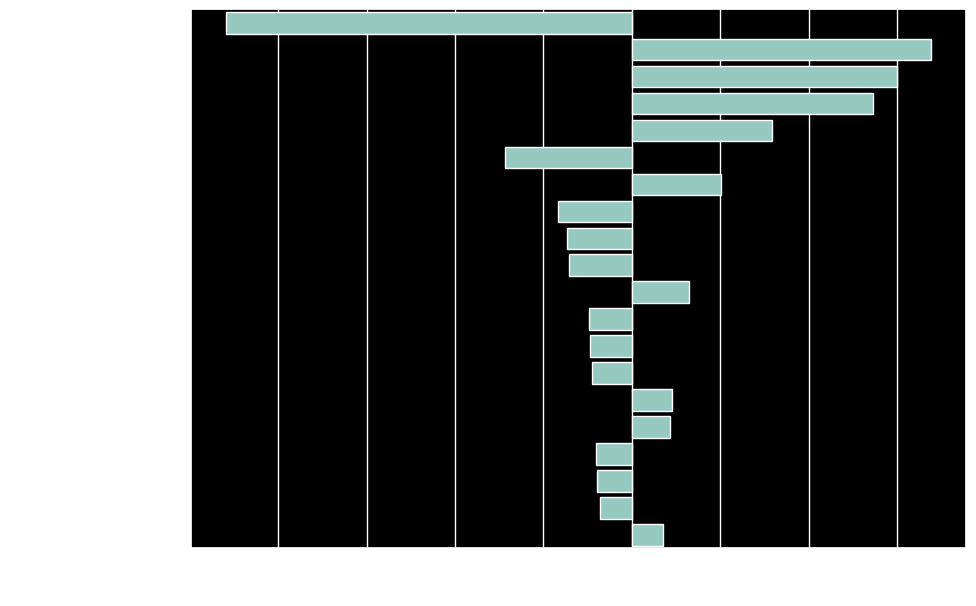

In [46]:
plt.figure(figsize=(10,7))
sns.barplot(data=coef_df.head(20), x='Coefficient', y='Feature', )

## Making Predictions and Evaluating the Model

We can now use the trained model to make predictions on the training, test 

In [47]:
X_train = train_inputs[numeric_cols+encoded_cols]
X_val = val_inputs[numeric_cols+encoded_cols]
X_test = test_inputs[numeric_cols+encoded_cols]



In [48]:
train_targets = np.array([train_targets]).flatten()

In [49]:
train_preds = model.predict(X_train)
train_preds_df = pd.DataFrame({'train_preds' : train_preds, 'train_targets': train_targets.flatten()})
train_preds_df

,train_preds,train_targets
0,No,No
1,No,No
2,No,No
3,No,No
4,No,No
...,...,...
97983,No,No
97984,No,No
97985,No,No
97986,No,No


We can test the accuracy of the model's predictions by computing the percentage of matching values in `train_preds` and `train_targets`.

This can be done using the `accuracy_score` function from `sklearn.metrics`.

In [50]:
from sklearn.metrics import accuracy_score
accuracy_score(train_targets, train_preds)

0.8519206433440829

In [51]:
model.predict_proba(X_train)

array([[0.94401116, 0.05598884],
       [0.94074153, 0.05925847],
       [0.96093612, 0.03906388],
       ...,
       [0.98749113, 0.01250887],
       [0.98334678, 0.01665322],
       [0.87453425, 0.12546575]])

In [52]:
train_preds_df['prob_0'] = model.predict_proba(X_train)[:,0]
train_preds_df['prob_1'] = model.predict_proba(X_train)[:,1]
train_preds_df

,train_preds,train_targets,prob_0,prob_1
0,No,No,0.944011,0.055989
1,No,No,0.940742,0.059258
2,No,No,0.960936,0.039064
3,No,No,0.988998,0.011002
4,No,No,0.723124,0.276876
...,...,...,...,...
97983,No,No,0.984075,0.015925
97984,No,No,0.990997,0.009003
97985,No,No,0.987491,0.012509
97986,No,No,0.983347,0.016653


The model achieves an accuracy of 85.1% on the training set. We can visualize the breakdown of correctly and incorrectly classified inputs using a confusion matrix.
![alt text](UM28BCN-1.png)

In [53]:
from sklearn.metrics import confusion_matrix
confusion_matrix(train_targets, train_preds, normalize='true')

array([[0.94621341, 0.05378659],
       [0.4776585 , 0.5223415 ]])

Let's define a helper function to generate predictions, compute the accuracy score and plot a confusion matrix for a given st of inputs.

In [54]:
def predict_and_plot(inputs, targets, name=''):
    preds = model.predict(inputs)

    accuracy = accuracy_score(targets,preds)
    print("Accuracy: {:.2f}%".format(accuracy * 100))

    c_mat = confusion_matrix(targets,preds, normalize='true')
    sns.heatmap(c_mat, annot=True)
    plt.xlabel('Prediction')
    plt.ylabel('Target')
    plt.title('{} Confusion Matrix'.format(name));
    
    return preds

Accuracy: 85.19%


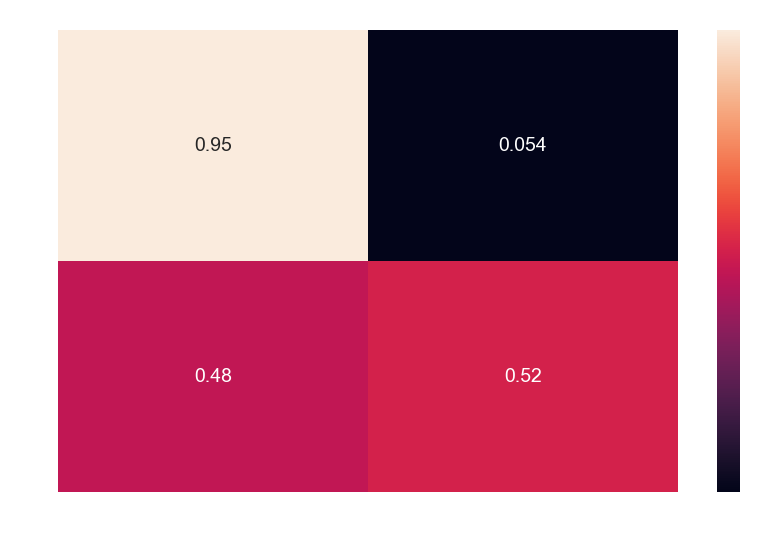

In [55]:
train_preds = predict_and_plot(X_train, train_targets, 'Training')

Accuracy: 85.40%


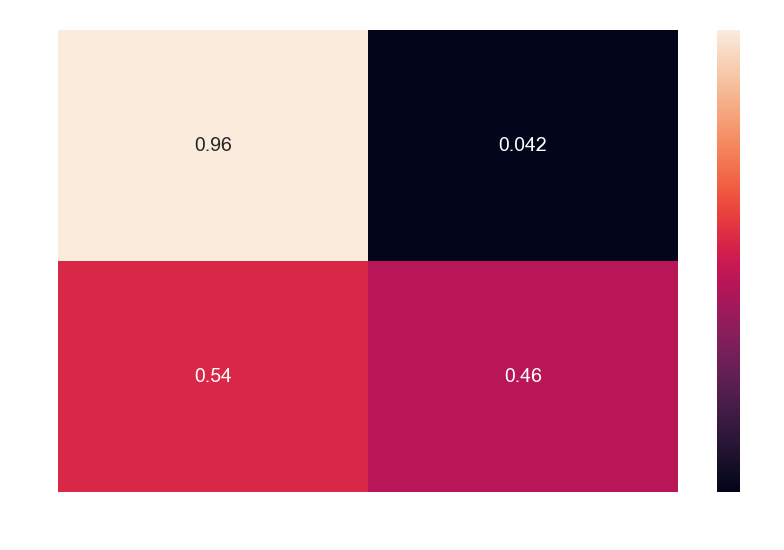

In [56]:
val_preds = predict_and_plot(X_val, val_targets, 'Validation')

Accuracy: 84.20%


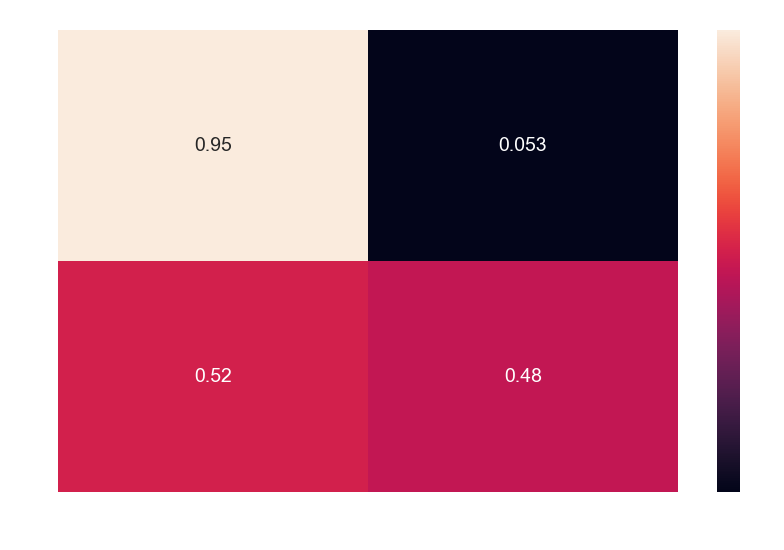

In [57]:
test_preds = predict_and_plot(X_test, test_targets, "Testing")

The accuracy of the model on the test and validation set are above 84%, which suggests that our model generalizes well to data it hasn't seen before. 

But how good is 84% accuracy? While this depends on the nature of the problem and on business requirements, a good way to verify whether a model has actually learned something useful is to compare its results to a "random" or "dumb" model.

Let's create two models: one that guesses randomly and another that always return "No". Both of these models completely ignore the inputs given to them.

In [58]:
def random_guess(inputs):
    return np.random.choice(["No", "Yes"], len(inputs))

def all_no(inputs):
    return np.full(len(inputs),'No')

In [59]:
accuracy_score(test_targets, random_guess(X_test))

0.49937767405678724

In [60]:
accuracy_score(test_targets, all_no(X_test))

0.7734344612991054

Our random model achieves an accuracy of 50% and our "always No" model achieves an accuracy of 77%. 

Thankfully, our model is better than a "dumb" or "random" model! This is not always the case, so it's a good practice to benchmark any model you train against such baseline models.

## Making Predictions on a Single Input

Once the model has been trained to a satisfactory accuracy, it can be used to make predictions on new data. Consider the following dictionary containing data collected from the Katherine weather department today.

In [61]:
new_input = {'Date': '2021-06-19',
             'Location': 'Katherine',
             'MinTemp': 23.2,
             'MaxTemp': 33.2,
             'Rainfall': 10.2,
             'Evaporation': 4.2,
             'Sunshine': np.nan,
             'WindGustDir': 'NNW',
             'WindGustSpeed': 52.0,
             'WindDir9am': 'NW',
             'WindDir3pm': 'NNE',
             'WindSpeed9am': 13.0,
             'WindSpeed3pm': 20.0,
             'Humidity9am': 89.0,
             'Humidity3pm': 58.0,
             'Pressure9am': 1004.8,
             'Pressure3pm': 1001.5,
             'Cloud9am': 8.0,
             'Cloud3pm': 5.0,
             'Temp9am': 25.7,
             'Temp3pm': 33.0,
             'RainToday': 'Yes'}

The first step is to convert the dictionary into a Pandas dataframe, similar to `raw_df`. This can be done by passing a list containing the given dictionary to the `pd.DataFrame` constructor.

In [62]:
new_input_df = pd.DataFrame([new_input])
new_input_df



,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
0,2021-06-19,Katherine,23.2,33.2,10.2,4.2,NaN,NNW,52.0,NW,...,20.0,89.0,58.0,1004.8,1001.5,8.0,5.0,25.7,33.0,Yes


We've now created a Pandas dataframe with the same columns as `raw_df` (except `RainTomorrow`, which needs to be predicted). The dataframe contains just one row of data, containing the given input.


We must now apply the same transformations applied while training the model:

1. Imputation of missing values using the `imputer` created earlier
2. Scaling numerical features using the `scaler` created earlier
3. Encoding categorical features using the `encoder` created earlier

In [63]:
numeric_cols = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']
categorical_cols = ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday']


In [64]:
new_input_df[numeric_cols]

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
0,23.2,33.2,10.2,4.2,NaN,52.0,13.0,20.0,89.0,58.0,1004.8,1001.5,8.0,5.0,25.7,33.0


In [65]:
new_input_df[numeric_cols] = imputer.transform(new_input_df[numeric_cols])
new_input_df[numeric_cols] = scaler.transform(new_input_df[numeric_cols])
new_input_df[encoded_cols] = encoder.transform(new_input_df[categorical_cols])

C:\Users\Sanjai\AppData\Local\Temp\ipykernel_9840\4090555460.py:3: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\Sanjai\AppData\Local\Temp\ipykernel_9840\4090555460.py:3: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\Sanjai\AppData\Local\Temp\ipykernel_9840\4090555460.py:3: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented 

In [66]:
X_new_input = new_input_df[numeric_cols + encoded_cols]
X_new_input

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,WindDir3pm_nan,RainToday_No,RainToday_Yes
0,0.747642,0.718336,0.027493,0.028966,0.526244,0.356589,0.1,0.229885,0.89,0.58,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


We can now make a prediction using `model.predict`.


## Final Prediction

To make a prediction with our trained logistic regression model, we prepare a new input using the same preprocessing steps applied to the training data. This ensures consistency in the input format.

We then feed this input into the model to predict whether the user will purchase the product (1) or not (0).

This demonstrates how the trained model can be used to make real-world predictions on unseen data.


In [68]:

# Ensure that the new input has the same columns as the training data
missing_cols = set(numeric_cols + encoded_cols) - set(new_input_df.columns)
for col in missing_cols:
    new_input_df[col] = 0  # Add missing columns with default 0

# Reorder columns to match the training set format
X_new_input = new_input_df[numeric_cols + encoded_cols]

# Make prediction
prediction = model.predict(X_new_input)[0]
print("Prediction for the new input (1 = No_RainTomorrow, 0 = Yes_RainTomorrow):", prediction)


Prediction for the new input (1 = No_RainTomorrow, 0 = Yes_RainTomorrow): Yes
